# Regression

So far our target ($y$) has always been of categorical type, i.e., we have been doing classification. However, it is very likely that one encounters situations where the target is continuous for example the previous example with incomes would have made much more sense with continuous target. We shall limit ourselves to situations where the target is a single value though there is no inherent reason why this would be the case. That is, we try to predict using item $\mathbf{x}$ the target value $y \in \mathbb{R}$. Since most have already been in courses of statistics you guessed it - we shall be first doing linear regression, but soon present tree regressor and random forest regressors as well. Notice also, that while in statistics regression is often used as synonym to linear regression for us it only means situations where we try to predict the values of continuous variable, regardless of the underlying method.
***
#### What:
1. Linear regression.
2. How to find the parameters in linear regression?
4. Gradient descent...? 
5. Tree regressor and RF regressors.
6. Examples of applying regressors - predicting.
***
#### Def 1. A computer program is said to learn from *experience* **E** with respect to some class of *tasks* **T** and *performance measure* **P**, if its performance at tasks in **T** as measured by **P**, improves with experience **E**. 

-Mitchell, T. (1997). Machine Learning.

In [2]:
# Import the required libraries
import pandas as pd # Pandas deals with handling data. 
import numpy as np # Numpy provides a lot of FAST ways for array manipulation in python.
import matplotlib.pyplot as plt # Plotting script library
import matplotlib as mpl # Plotting
import seaborn as sns # More plotting

%matplotlib inline 
# Define some plotting params:
mpl.rcParams['figure.figsize'] = (12,6)
sns.set_style("whitegrid", {"axes.facecolor": ".99"})
sns.set_style("ticks")

data = sns.load_dataset('penguins').dropna()
target = 'species'
xlabel = 'bill_length_mm'
ylabel = 'bill_depth_mm'

### Training supervised regressor using scikit-learn:

Let us start by just applying the linear regressor ([LinearRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html)) from sklearn to predict 'bill_depth_mm' Gentoo penguins given the 'bill_length_mm'. Recall Linear models:

$
y = \mathbf{w} \cdot \mathbf{x} + b, 
$

where $\mathbf{w} = [w_1,\dots,w_{\text{dim}(\mathbf{x})}]$ are the parameters of the model and $b$ is the bias. The model is actually affine since there is bias included. 

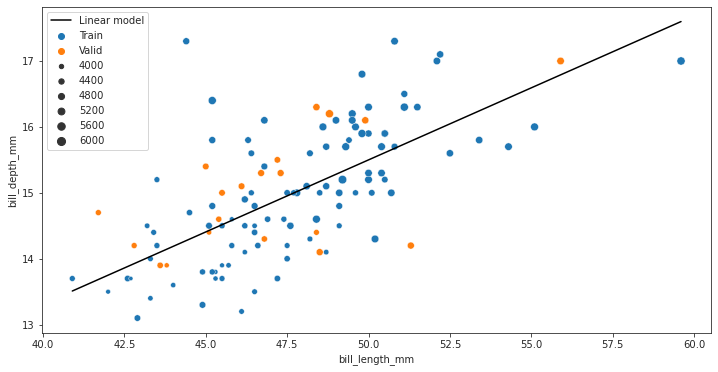

In [4]:
from sklearn.model_selection import train_test_split

# select only single species from the data
species = 'Gentoo'
mask = data.species == species
data_gentoo = data[mask]

# Select only species
X = data_gentoo.loc[:, xlabel].values.reshape(-1, 1)
y = data_gentoo.loc[:, ylabel].values

# Pick the validation set randomly:
valid_idx = np.random.choice(len(X), size=20, replace=False)

# Train valid mask:
trainvalid = np.zeros(len(X), dtype=bool)
trainvalid[valid_idx] = True

# Import the linear regression model
from sklearn.linear_model import LinearRegression


# We fit the linear model to training data:
linreg = LinearRegression().fit(X[~trainvalid, :], y[~trainvalid])

ax = sns.scatterplot(data=data_gentoo, 
                     x=xlabel, 
                     y=ylabel, 
                     hue=[{0:'Train', 1:'Valid'}[tr] for tr in trainvalid], 
                     palette={'Train':'C0', 'Valid':'C1'},
                     size='body_mass_g')

xmin = data_gentoo.loc[:, xlabel].min()
xmax = data_gentoo.loc[:, xlabel].max()
ymin = data_gentoo.loc[:, ylabel].min()
ymax = data_gentoo.loc[:, ylabel].max()

xrange = np.linspace(xmin, xmax, 20)
ax.plot(xrange, linreg.coef_[0]*xrange + linreg.intercept_, color='black', label='Linear model')

_ = plt.legend()

### Discussion:

In statistics it is not common (?) to use 'valid sets' to estimate the goodness of a model  fit (here model = linear regression) - why do we do it now? The reason is that statisticians make (analytical) models - they have (hopefully) well grounded reasons to believe that their model ought to work, or they are in a process of testing if it works. They understand the risks of having a lot of free parameters and implement serious protections to not fool themselves:

#### "*The first principle is that you must not fool yourself — and you are the easiest person to fool.*"

-Richard Feynmann

If a test statistic measuring the goodness of a model $M$ given the data tells that the model $M$ indeed explains the data (to ceratin confidence) statisticians are happy - they have managed to produce understanding (in form of the mathematical model $M$) and the phenomena under consideration is 'explained'. On the other hand in ML you do not often seek to produce understanding(..?) of the process generating the data you work with. I mean, does an ann fitted to predict pet breeds give you any additional insights in understanding pet breeds - quite often no. Does it predict from a given item which pet breed there is in the image - most often yes. What you are seeking after are *predictions* about unseen data items that you expect to receive and on the validity of those predictions. Hence, you also are not certain that even if you manage to fit your model into your *training data* that it works in the *real world*. You see, statistician actually understood what is going on, and thus also know the limitations of the model and where to apply it - you do not possess such a luxury, the only way to make sanity checks about your ML model is to test it in the validation data.

An important thing to note is that sampling the validation/test sets is not always as straightforward as one initially might expect. When picking the validation and test sets think that they ought to represent the data you are going to encounter in the runtime. Think if your validation/test sets actually represent something you would see in the deployment environment and try not to fool yourselves! However, such considerations are outside the scope for us for now.

***
### If you are not careful this can happen:

The talk about models and 'understanding' is rather vague, after all there is no much room for ML in the above example in the first place to begin with. Let us anyhow show what might happen if you get a bit carried away with you linear regression and only consider the goodness of the fit ([R^2 score](https://en.wikipedia.org/wiki/Coefficient_of_determination)) in the training data. The actual choice of score is not the point here so do not mind it.

We take the same dataset as before, but 'augment' it to also include powers of the xlabel to obtain better fits in the training data:

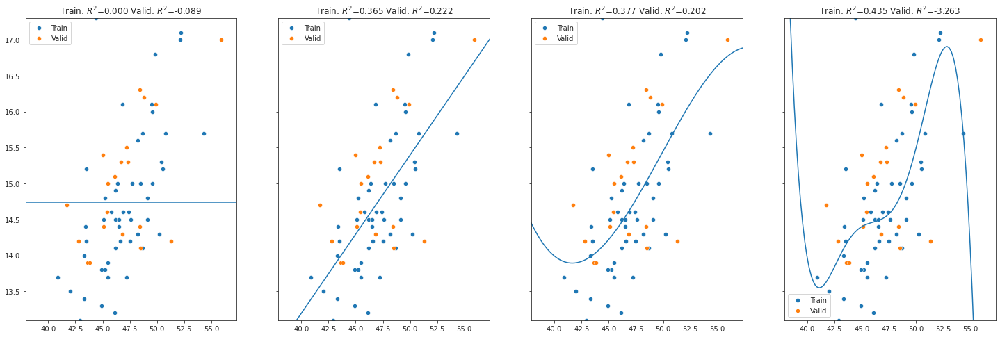

In [5]:
from sklearn.preprocessing import PolynomialFeatures


_, axarr = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(25, 8))
X_train = X[trainvalid==0][::2]
X_valid = X[trainvalid==1]
y_train = y[trainvalid==0][::2]
y_valid = y[trainvalid==1]


for degree, ax in zip([0, 1, 3, 6], axarr.flatten()):
    poly = PolynomialFeatures(degree=degree)
    
    X_train_aug = poly.fit_transform(X_train)
    linreg.fit(X_train_aug, y_train)
    
    sns.scatterplot(x=X_train.flatten(), y=y_train, ax=ax, label='Train')
    sns.scatterplot(x=X_valid.flatten(), y=y_valid, ax=ax, label='Valid')
    
    
    X_valid_aug = poly.transform(X_valid)
    xrange = np.linspace(xmin-5, xmax+5, 150).reshape(-1, 1)
    
    X_plot = poly.transform(xrange)
    y_pred = linreg.predict(X_plot)
    
    ax.plot(xrange, y_pred, label='Fit, degree={}'.format(degree))
    
    # Notice that linreg carries its own score function with it:
    R2_train = linreg.score(X_train_aug, y_train)
    R2_valid = linreg.score(X_valid_aug, y_valid)
    
    ax.set_title(r'Train: $R^2$={:.3f} Valid: $R^2$={:.3f}'.format(R2_train, R2_valid))
    ax.set_ylim([ymin, ymax])
    ax.set_xlim([X_train.min()-3, X_train.max()+3])

In the above, which of the models overfitted and which underfitted? Notice also, that the sole reason for us being able to see that the model on the right and left are bad (apart from maybe the $R^2$ scores for underfitted one) is that we plot the model fit and the data. In practice there are often dozens if not hundreds of dimensions, there is no hope for one to be able to visually inspect if the ML model fit is reasonable or not.

The thing is with dozens, hundreds or millions (neural networks) of free parameters in a flexible enough model you are basically able to capture whatever you aim (for example those pet breeds). Part of the challenge is not to capture *only* the thing you present but also *generalize* well outside the training data. This is again discussion of under/over fitting.

#### "*With four free parameters I can fit an elephant, and with five I can make it wiggle its trunk*" 

-John von Neumann

And that is not to say that free parameters are cool and great thing (at least outside ML)... The validation set is for us to figure out the right number of parameters to build the ml model. You do not want to (over)fit you model to the single elephant wiggling its trunk if the aim is to classify elephants in general! Also you need enough parameters to fit that elephant; even von Neumann did not claim he can do it with only two free parameters!
***

# Finding parameters:

This is not something you specifically need to worry about due to the applied nature of this course. However, hopefully many of you agree that it might be of value to understand at least conceptually what is happening under the hood.

#### Word about notation:

* ml model $M$ - since model is function of its parameters $\mathbf{w}$ we write $M_\mathbf{w}$ and further predictions of model are $y = M_\mathbf{w}(\mathbf{x})$.
* input $\mathbf{x}=[x_1,\ldots,x_n]$
* Loss is a function of the model parameters and the training data, $L(M_\mathbf{w}, \mathbf{X}_\text{train}, \mathbf{y}_\text{train})$, however, since the training data and model are often fixed we write $L(\mathbf{w})$.
* Symbols in **bold** are vectors or matrices.

What we are basically left to do is to understand how the LinearRegressor can find the coefficients ($\mathbf{w}, b$) it uses. If we can understand this we are quite well off in the business of ML including the neural networks. We are actually pretty close since we already in the above had the $R^2$ score as an estimate for the goodness of the LinReg fit. Obviously, the task is to find parameters $\mathbf{w}$ so that the $R^2$ score, given the labeled training data, is maximized - let us do exactly that. Maximizing a function is equivalent to minimizing its opposite value (multiply by -1) so we actually minimize $-R^2$. Further we start to shall talk about Loss $L (=-R^2$ for now), in ML it is common to define a loss function and minize that instead of maximizing a score - obviously the two are equivalent and only a matter of choice. 

First we show how one can, using a concept called gradient, figure out a appropriate update direction(/step) for the model parameters $\delta \mathbf{w}$ given the current parameters $\mathbf{w}$ and the loss function $L$. Gradient of function $L(\mathbf{w})$ (here $\mathbf{w} \in \mathbb{R}^m$) is (we assume $f$ behaves resonably i.e., it is continuous in $\mathbf{w}$ etc.):

$
\text{grad}_\mathbf{w}L(\mathbf{w}) =: \nabla_\mathbf{w} L(w_1,\dots,w_m) = [\frac{\partial}{\partial w_1}L(\mathbf{w}), \dots, \frac{\partial}{\partial w_m}L(\mathbf{w})],
$
where we just took the partial derivatives of the loss with respect to all the model parameters. Hopefully you are familiar with concept of derivative, it just tells how the loss changes if $w_i$ is changed a little - we'll have an example in a minute.

For any parameters $\mathbf{w} + \delta \mathbf{w}$ close to $\mathbf{w}$ it holds ([Taylor expansion](https://en.wikipedia.org/wiki/Taylor_series)):

$
L(\mathbf{w} + \delta \mathbf{w}) \approx L(\mathbf{w}) + \nabla_\mathbf{w} f(\mathbf{w}) \cdot \delta \mathbf{w}.
$

To receive the largest decrease after step $\delta\mathbf{w}$ we have to have $\delta\mathbf{w} || \nabla f(\mathbf{w})$, remember that these are vectors.. and specifically for decrease ($\nabla_\mathbf{w} L$ points into the direction of maximal increase!) we use:

$
\delta\mathbf{w} = -l_r \nabla_\mathbf{w} L(\mathbf{w}),
$

where $l_r$ is called learning rate. It is important to remember that the approximate eq. only holds if $\text{norm}(\delta\mathbf{w})$ is small and hence $l_r$ needs to be picked appropriately. Anyhow, we see that we can gradually move towards the minimum of $L(\mathbf{w})$ if we just at each step $i$ (do not confuse this with the vector component index) update the current parameters $\mathbf{w}$:

$
\mathbf{w}_{i+1} \rightarrow \mathbf{w}_i - l_r \nabla_\mathbf{w} L(\mathbf{w}_i).
$ 

If this is sketchy, you can check: 
* Python Machine learning: Chapter 2 - Sebastian Raschka.
* Google Gradient descent...
* Stanford [CS229 - lecture 2](https://www.youtube.com/watch?v=4b4MUYve_U8&list=PLoROMvodv4rMiGQp3WXShtMGgzqpfVfbU&index=2)
***
Lets now implement this and see what happens: 

In [6]:
def get_grad(func, w, dw, *args):
    """
    How does the value of func change when we modify each component of 
    w by dw:
    
    Never implement this kind of (mathematical) functions yourself unless for 
    demonstration purposes only. They exist in libraries are are 
    done way better there!
    """
    grad = np.zeros(len(w))
    # loop over the w parameters:
    for i in range(len(w)):
        # copy the original array:
        wdw = w.copy()
        # modify the parameter at index i:
        wdw[i] += dw
        # Check how the function value changes and divide by the dw value, i.e., when lim dw --> 0 this is the derivative of func at point w.r.t. w[i]:
        grad[i] = (func(wdw, *args) - func(w, *args))/dw
        
    return grad

#### Simple example for gradient descent:

Let us using the get_grad() find a minimum for function func as described above:

In [9]:
func = lambda w: w**2

# Specify the learning rate:
lr = .1

# Initial quess for minima:
x = np.array([1.])

# N steps to take:
N = 50

# progress table for plotting the results:
progress = np.zeros((N, 4))

# loop and take gradient descent step at each iteration:
for i in range(N):
    
    # Get the gradient at current point:
    grad = get_grad(func, np.array([x]), .00001)
    
    # Step in x is the -grad * learning rate
    stepx = -grad*lr
    
    # The anticipated step in y is, however, this is only approximation.
    stepy = np.dot(grad, stepx)
    
    # Store the progress for plotting...
    progress[i,:] = x, func(x), stepx, stepy 
    
    # Update the position:
    x += stepx #lr*grad
    
animate_descent(progress, func, np.linspace(-.2, 1, 20))     

## Lets then apply this machinery to find the linreg coefficients:

In [10]:
# Create new sample data..
X_train = np.linspace(0, 1, 100).reshape(-1, 1) 
y_train = X_train.flatten()*1 + 1 + np.random.normal(size=100, scale=.1)

def set_linreg_params(linreg, w):
    """
    Helper to set the linreg params:
    """
    # Set the coefficients:
    linreg.coef_ = w[:-1]
    # Set the intercept
    linreg.intercept_ = w[-1]
    
    
    return linreg

def get_neg_R2(w, X, y, linreg, retlog):
    """
    Get the NEGATIVE R^2 score of the lin regressor with params w:
    Negative so that we can minimize it...
    
    R^2 (R squared) score is defined as:
    R^2 = 1-u/v  [= 1 - MSE/var(y)],
    where,
    u = sum_i (y_i - f(x_i))^2
    v = sum_i (y_i - y_mean)^2
    """    
    linreg = set_linreg_params(linreg, w)
    
    negscore = -linreg.score(X, y)
    if retlog:
        return np.log(negscore+2)
    else:
        return negscore

# Create new LinReg...
linreg = LinearRegression()

# Initial quess for the linreq coefficients:
w = np.array([0.1, 0], dtype=float)

# Learning rate - you need to be bit careful with this:
lr = .01

# Number of steps to take:
N = 100

# Array to store progress:
wprogress = np.zeros((N, 3))

# If you rescale the R^2 scores.
uselog = False

# Iterate over N steps:
for i in range(N):
    
    # Put the linreq params in place:
    linreg = set_linreg_params(linreg, w)
    
    # Get the gardient att current point - w:
    wg = get_grad(get_neg_R2, w, .00001, X_train, y_train, linreg, uselog)
    
    # Store progress:
    wprogress[i, :] = *w, -linreg.score(X_train, y_train)
    
    # Update the current point by the gradient descent step:
    w -= wg*lr
    
    if i%10 == 0:
        print(w, -wg*lr, np.linalg.norm(wg*lr), wprogress[i, -1])



animate_linreg(wprogress, X_train, y_train, uselog)


[0.27846994 0.32400274] [0.17846994 0.32400274] 0.36990443778756577 23.167217096963274
[0.73576507 1.09436512] [0.00931013 0.00963651] 0.013399281023734638 -0.8101178184226743
[0.78015231 1.10596777] [ 0.00297887 -0.00108671] 0.0031709008077710436 -0.8508302908745542
[0.80613858 1.09327434] [ 0.00238407 -0.00125994] 0.0026965271375625757 -0.8594265507132104
[0.82803883 1.08158023] [ 0.00204195 -0.00109373] 0.0023164159505809565 -0.8657440787905408
[0.84683752 1.07150687] [ 0.00175392 -0.00093997] 0.001989919911348815 -0.8704061219724786
[0.86298604 1.06285238] [ 0.0015067  -0.00080749] 0.0017094431431376549 -0.8738465129771303
[0.87685843 1.05541769] [ 0.00129433 -0.00069368] 0.001468499230988594 -0.8763853700748292
[0.88877552 1.04903091] [ 0.0011119 -0.0005959] 0.0012615160673401548 -0.8782589294122458
[0.89901292 1.04354434] [ 0.00095518 -0.00051191] 0.0010837069266929887 -0.8796415250492409


<ipython-input-8-09b6c1b55ad7>:96: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  cax  = fig.add_axes([0.8, 0.15, 0.05, 0.3], label='cbarax')


## What on earth this has to do with neural networks?!?

Earlier I said you would well off in the business of neural networks as well if you just crasped the gradient descent. How is this parameter optimization related to fitting an ann to images of pets? You see, in our linear model we have only two parameters ($w, b$) and we 'fit' them so that the Loss ($-R^2$) of the fit to training data is minimized. We use gradient descent to find the 'optimal' parameters

$
(w_\text{opt}, b_\text{opt}) = \underset{(w, b)}{\arg \min} -R^2(\text{LinReg}_{(w, b)}, X_\text{train}, y_\text{train}),
$

'optimal', because we shall never hit the actual true optimal, bu in practce this will be good enough. We can use the same technigues to optimize the parameters $\mathbf{W}$ of any model (yes can be ann) $\mathcal{M}_\mathbf{W}$. Having some appropriate loss function $L$:

$
\mathbf{W}_\text{opt} = \underset{\mathbf{W}}{\arg \min} L(\mathcal{M}_\mathbf{W}, X_\text{train}, y_\text{train}),
$

maybe needless to say that there are quite a few details on the way, but once you have specified your loss $L$ (the loss also needs to behave 'nicely' when the parameters are changed), your model $\mathcal{M}_\mathbf{W}$, and you have labeled training data, you may start to find the optimal parametrs using gradient descent. In some cases you can also skip the training data labels! The loss does not need to depend in $y$...

The thing you just saw is called Batch Gradient Descent, because we used the full training batch to evaluate the loss function $L$. In practice this is often infeasible, there can be millions of training examples. In these cases one resorts to Stochastic Gradient Descent, it separates from the above only in a way that the loss $L$ is evaluated only for a subset (*batch size*) of the training examples. The gardient is evaluated for this mini-bach and a step taken, one *epoch* denotes when the full training set has once been went through - I suppose you have been exposed to these terms already.

### Guestion:
1. Fix the above cell so that it implements Stochastic gradient descent with a batch size of your choice. You only need to modify the get_grad (i.e., supply the current minibach instead of full training set). 

***
Let us now consider the tree and rf regressors. First download some data...


In [28]:
from sklearn.datasets import fetch_openml
random_state=42

# Fetch the data:
boston = fetch_openml(name='boston', version=1)

# Make dataframe
X = pd.DataFrame(data=boston.data, columns=boston.feature_names)

# Map categorical features
for cat_feat, vals in boston.categories.items():
    # cat_feat is the name of the categorical feature
    # vals are the categories
    map_d = dict(zip(range(len(vals)), vals)) # -> {0:'cat_0', 1:'cat_1', ...}
    X.loc[:, cat_feat] = X.loc[:, cat_feat].astype(int).map(map_d).astype('category')

# Get the targete...
y = pd.Series(data=boston.target, name=boston.target_names[0])

# Train test split.
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=random_state, test_size=.1)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, random_state=random_state, test_size=.2)

# Make a dat to work with...
data=pd.concat((X_train, y_train), axis=1)

## Tree Regressors:

So much for linear regression now we quickly introduce Tree and RF regressors so that you are aware of those. Remember how in the tree node splitting (TreeClassifiers notebook) was base on information gain at each split? The eq. for information gain was:

$
\text{I}(\mathbf{y}, A) = \mathbb{E}_A[\text{IG}(\mathbf{y}, a)] = H(\mathbf{y}) - \sum_a p(a) H(\mathbf{y}|a),
$

for regression we just replace the entropies vith the leaf variances! Before we wanted to maximize for the infromation gain after each split, quess what, now we minimize the variance after each split - simple as that (variance is $\text{var}(\mathbf{y}) = \frac{1}{N}\sum_{i=1}^N (y_i - \bar{y})^2$). We hence use the variance reduction score:

$
\text{I}_V(\mathbf{y}, A) = \text{var}(\mathbf{y}) - p(\mathcal{L})\text{var}(\mathbf{y}_\mathcal{L})- p(\mathcal{R})\text{var}(\mathbf{y}_\mathcal{R}),
$

here $\mathcal{L}/\mathcal{R}$ denote the left and right leafes as before and $\mathbf{y}_\mathcal{R}$ are the samples that fell into right leaf. Building a tree progresses as before, only the condition for leaf splitting has changed. When doing the inference or predicting you supply the average of the target in the leaf you are in. You guessed it, for

## Random Forest Regressors

we also don't need to do much. Replace the underlying tree classifiers by tree regressors, and when taking the majority vote of the trees in the forest, instead take the mean of the target values in the terminal nodes...

Lets see how these work in Boston housing dataset...

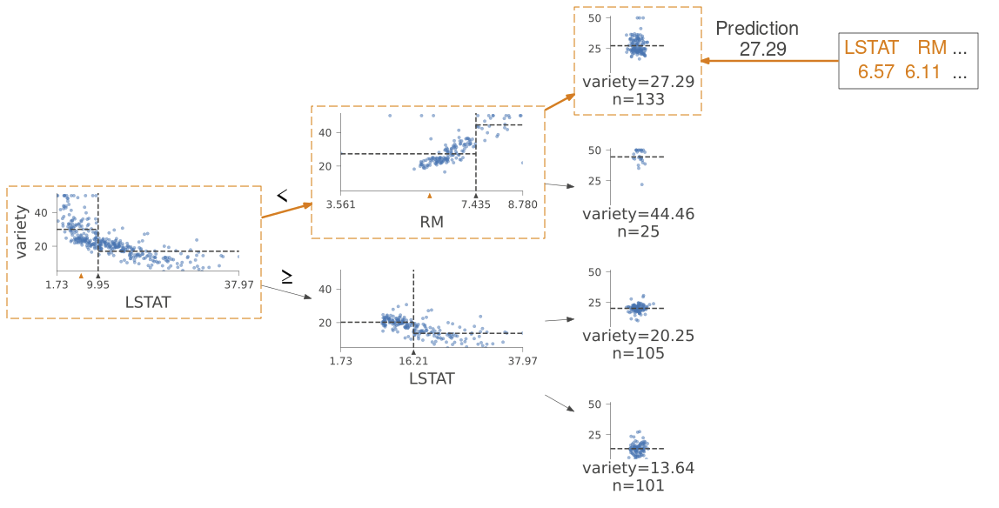

In [29]:
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeRegressor
from IPython.display import Image
from dtreeviz.trees import *

tree_clf = DecisionTreeRegressor(max_depth=4)  # limit depth of tree


tree_clf.fit(X_train, y_train)


viz = dtreeviz(tree_clf,
               X_train,
               y_train,
               target_name='variety',
               feature_names=X_train.columns, 
               scale=2,
               orientation='LR',
               X=X_valid.iloc[0]) 
              
viz.view()


Image("DTreeRegViz.png")

To think:
1. Nice exercise is to modify the codes that figured out the leaf split value for given feature in the case of DecisionTreeClassifiers so that they instead of entropy use, the variance reduction as split condition. 

### First we plot...

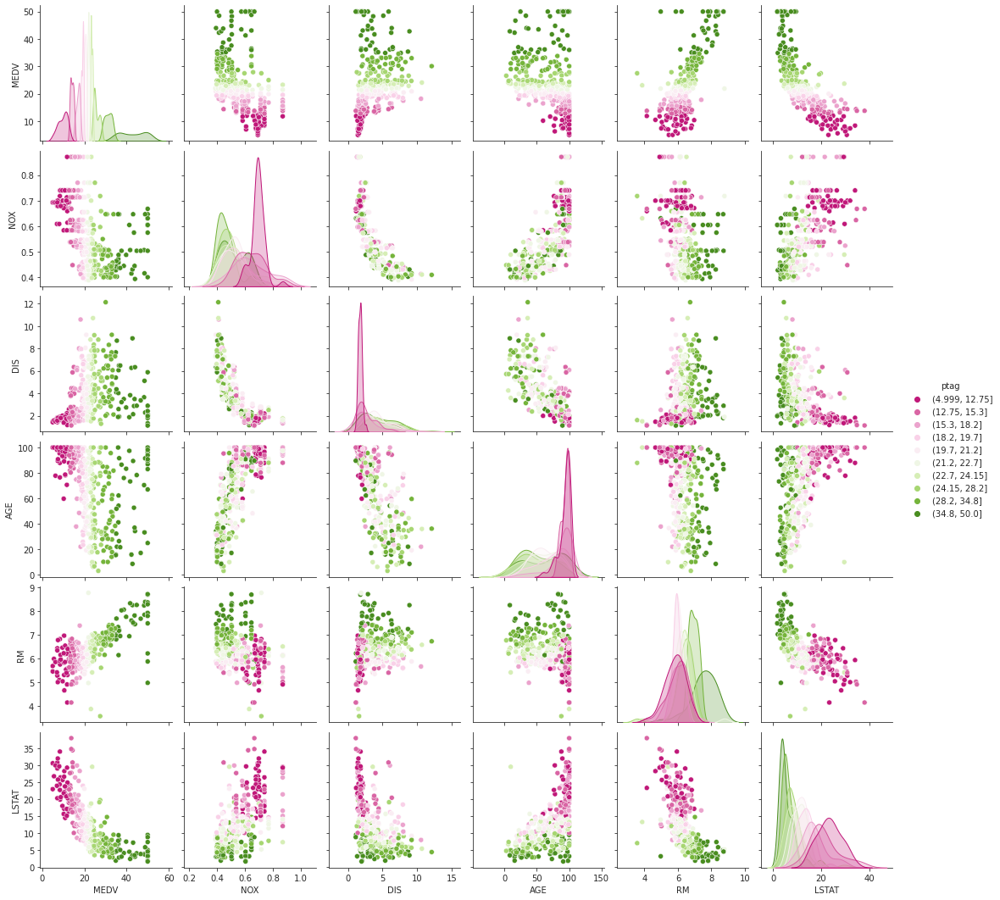

In [10]:
cols = [y.name, 'NOX', 'DIS', 'AGE', 'RM', 'LSTAT']
# Lets group the houses into ncat price categories (equal in size):
ncat = 10
price_groups = pd.qcut(y, ncat) 

# Wa also need to make df with the ptag in columns...
plot_data = data.loc[:, cols]
plot_data.loc[:, 'ptag'] = price_groups

cmap_name = 'PiYG'
# Then it works:
sns.pairplot(plot_data, hue='ptag', palette=sns.color_palette(cmap_name, n_colors=ncat)) 

Seem like LSTAT and RM are good indicators for house price. Lets use RandomForesRegresso to build a model of house price base on those two features.

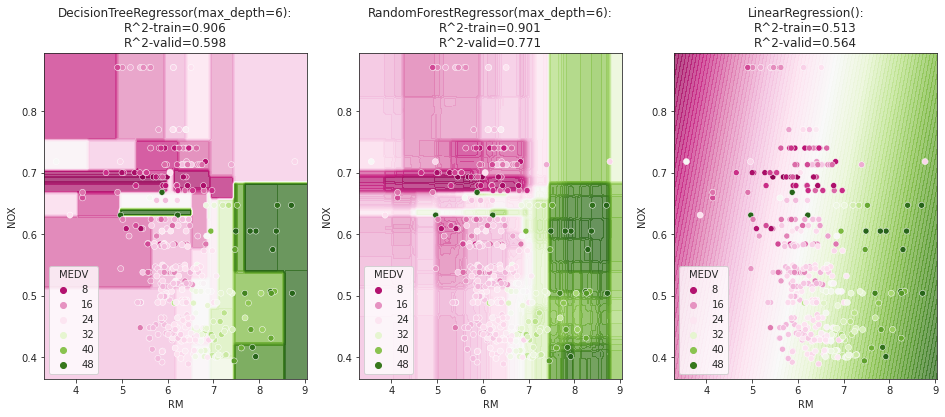

In [11]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

xlabel = 'RM'
ylabel = 'NOX' #'LSTAT'

def plot_clf2d(clf, ax=None):
        
    X_train_arr = X_train.loc[:, [xlabel, ylabel]].values
    clf.fit(X_train_arr, y_train)
    
    if ax is None:
        _, ax = plt.subplots(figsize=(8,8))
    # Create a meshgrids of x and y values
    xr = X_train_arr[:, 0].ptp()*.05
    yr = X_train_arr[:, 1].ptp()*.05
    x_min, x_max = X_train_arr[:, 0].min() - xr, X_train_arr[:, 0].max() + xr
    y_min, y_max = X_train_arr[:, 1].min() - yr, X_train_arr[:, 1].max() + yr
    
    
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                         np.linspace(y_min, y_max, 100))

    Z = clf.predict(np.vstack((xx.ravel(), yy.ravel())).T)
    Z = Z.reshape(xx.shape)
    
    cs = ax.contourf(xx, yy, Z, cmap=plt.get_cmap(cmap_name), levels=100, alpha=.7)
    sns.scatterplot(x=X_train_arr[:, 0], y=X_train_arr[:, 1], hue=y_train, palette=cs.get_cmap(), ax=ax)
    
    valid_score = clf.score(X_valid.loc[:, [xlabel, ylabel]], y_valid)
    train_score = clf.score(X_train.loc[:, [xlabel, ylabel]], y_train)
    ax.set_title('{}:\nR^2-train={:.3f}\nR^2-valid={:.3f}'.format(clf, train_score, valid_score))
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    
    

_, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,6))
depth = 6
treereg = DecisionTreeRegressor(max_depth=depth)
plot_clf2d(treereg, ax=ax1)
rfreg = RandomForestRegressor(max_depth=depth)
plot_clf2d(rfreg, ax=ax2)
linreg = LinearRegression()
plot_clf2d(linreg, ax=ax3)

Why are the prediction by the LinearRegressor as they are? The structure is way simpler than for rf or tree regressors. Could you fix that somehow?

### 1D case:

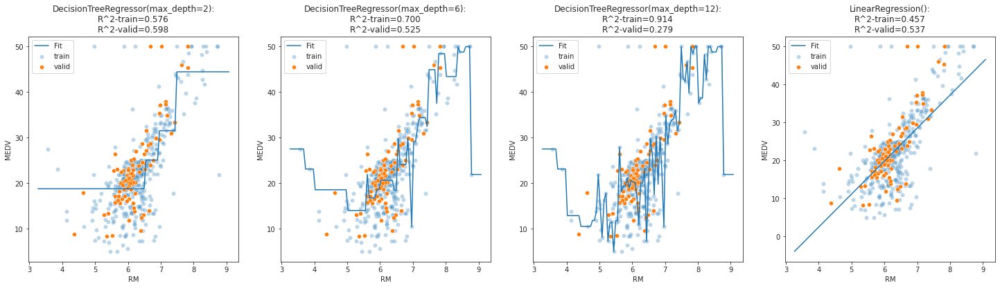

In [12]:
def plot_clf1d(clf, ax=None):
        
    X_train_arr = X_train.loc[:, [xlabel]].values
    clf.fit(X_train_arr, y_train)
    
    if ax is None:
        _, ax = plt.subplots(figsize=(8,8))
    
    xx = np.linspace(X_train_arr.min()-.3, X_train_arr.max()+.3, 100).reshape(-1, 1)
    
    preds = clf.predict(xx)
    
    
    cs = ax.plot(xx, preds, label='Fit')
    sns.scatterplot(x=X_train_arr.flatten(), y=y_train, ax=ax, alpha=.3, label='train')
    sns.scatterplot(x=X_valid.loc[:, xlabel], y=y_valid, ax=ax, alpha=1, label='valid')
    
    valid_score = clf.score(X_valid.loc[:, [xlabel]], y_valid)
    train_score = clf.score(X_train.loc[:, [xlabel]], y_train)
    
    ax.set_title('{}:\nR^2-train={:.3f}\nR^2-valid={:.3f}'.format(clf, train_score, valid_score))
    ax.set_xlabel(xlabel)
    #ax.set_ylabel(ylabel)

_, axarr = plt.subplots(1,4, figsize=(25,6))

for i, depth in enumerate([2, 6, 12]):
    treereg = DecisionTreeRegressor(max_depth=depth)
    plot_clf1d(treereg, axarr[i])
    
linreg = LinearRegression()
plot_clf1d(linreg, axarr[-1])

***
#### Questions:
1. Say you had a time series data where you would be interersted in some quantity in the future, how would you then pick the training and validation sets? 
2. Can you explain what will happen to items with feature values larger than anything seen in the training set when inference of the target is made using tree or rf regressors?
***
# Utils to do the animations:

In [8]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib import rc

rc('animation', html='jshtml') #, html='html5')

def animate_descent(progress, fun, xrange):
    
    fig, ax = plt.subplots()
    
    # Lines to plot
    dx, = ax.plot([], [], '-', color='C0', lw=2)
    dy, = ax.plot([], [], '-', color='C0', lw=2)
    
    
    scat = ax.scatter([], [], label='steps')
    
    def init():
        
        # Init the axeses:
        ax.plot(xrange, fun(xrange), color='C1', label='Fun')
        
        return dx, dy, scat, 

    def update(frame):
        
        
        x, y, dx_, dy_ = progress[frame, :]
        
        # Update the line points
        dx.set_data([x, x+dx_], [y, y])
        dy.set_data([x+dx_, x+dx_], [y, y+dy_])
        
        X = np.c_[progress[:frame+1, 0], progress[:frame+1, 1]]
        scat.set_offsets(X)
        #scat.set_offsets(progress[:frame, 0], progress[:frame, 1])
        
        
        return dx, dy, scat, 

    ani = FuncAnimation(fig, update, 
                        frames=np.arange(len(progress)), 
                        interval=int(10000/len(progress)),
                        init_func=init, blit=True)
    
    plt.close() # Remove the otherwise annoying extra plot..
    return HTML(ani.to_jshtml())

def animate_linreg(w, X_train, y_train, logscore=False): #, linreg): #, model=None):
    
    fig, (ax1, ax2) = plt.subplots(1, 2)
    
    # Lines to plot
    ln_pred, = ax1.plot([], [], '-', color='C0', lw=1, label='Estim')
    ln_params, = ax2.plot([], [], '-o', color='C0', lw=1, label='Score')
    
    
    sc = .1
    wmin, wmax, wrange = w[:, :2].min(), w[:, :2].max(), w[:, :2].ptp()
    xmin, xmax = wmin - sc*wrange, wmax + sc*wrange
    ymin, ymax = wmin - 1*sc*wrange, wmax + 2*sc*wrange
    
    ax1.scatter(X_train.flatten(), y_train, label='Train instances', c='C0')
    
    cmap_name = 'PiYG'
    x = X_train.flatten()               
    
    
    def plot_score_surf():
        
        linreg = LinearRegression()
        
        ax2.set_xlim([xmin, xmax])
        ax2.set_xlabel('w')
        ax2.set_ylabel('Intercept')
        if logscore:
            ax2.set_title('Log(-R^2 + 1) - score surface')
        else:
            ax2.set_title('Negative R^2-score surface')
        
        N = 100
        xx, yy = np.meshgrid(np.linspace(xmin, xmax, N),
                             np.linspace(ymin, ymax, N))
        
        Z = np.zeros(N**2)
        
        for i, w in enumerate(np.vstack((xx.ravel(), yy.ravel())).T):       
            Z[i] = get_neg_R2(w, X_train, y_train, linreg, logscore)
            
        Z = Z.reshape(xx.shape)
    
        cs1 = ax2.contourf(xx, yy, Z, cmap=plt.get_cmap(cmap_name), levels=100, alpha=.5)
        cs2 = ax2.contour(xx, yy, Z, cmap=plt.get_cmap(cmap_name), levels=20, alpha=1, linestyles='solid')
        ax2.axis('equal')
        
        cax  = fig.add_axes([0.8, 0.15, 0.05, 0.3], label='cbarax')
        
        fig.colorbar(cs1, ax=ax2, cax=cax)
        
        
        return ax
    
    def init():
        
        # Init the axeses:
        ax1.set_xlabel('x')
        ax1.set_ylabel('y')
        ax1.set_title('Data and fit:')
        ax1.legend()
        
        plot_score_surf()
        ax2.legend(loc=2)
        
        return ln_pred, ln_params,  

    def update(frame):
        
        a = w[frame, 0]
        b = w[frame, 1]
        
        # Update the line points
        ln_pred.set_data(x, a*x + b)
        #ln_score.set_data(range(frame+1), w[:(frame+1), 2])
        ln_params.set_data(w[:frame+1, 0], w[:frame+1, 1])
        
        
        return ln_pred, ln_params, 

    ani = FuncAnimation(fig, update, 
                        frames=np.arange(len(w)), 
                        interval=int(10000/len(w)),
                        init_func=init, blit=True)
    
    plt.close() # Remove the otherwise annoying extra plot..
    return HTML(ani.to_jshtml())